# Regression with a crab age dataset

[Here](https://www.kaggle.com/competitions/playground-series-s3e16/overview)

In [121]:
# imports 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
from scipy.stats import boxcox


from typing import List, Tuple

In [27]:
# Method to rename columns: (Cast to Lower Case and replace space with underscore)
def rename_columns(df: pd.DataFrame) -> pd.DataFrame:
    new_names = {col: col.lower().replace(" ", "_") for col in df.columns}
    df = df.rename(new_names, axis=1)
    return df

def find_cols_with_miss_vals(df: pd.DataFrame) -> List:
    sm_df = df.isna().sum()
    sm_df = sm_df[sm_df > 0]
    return sm_df.index.tolist()

In [33]:
train_df = pd.read_csv("../data/input/train.csv", index_col=0)
test_df = pd.read_csv("../data/input/test.csv", index_col=0)
original_df = pd.read_csv("../data/input/original.csv")

train_df = rename_columns(train_df)
test_df = rename_columns(test_df)
original_df = rename_columns(original_df)

In [40]:
print(f"Shape of Original Data: {original_df.shape}")
print(f"Columns with missing value Original Data: {find_cols_with_miss_vals(original_df)}")
print(f"dtypes of columns in Original Data: \n{original_df.dtypes.to_string()}")

original_df.sex.value_counts()

Shape of Original Data: (3893, 9)
Columns with missing value Original Data: []
dtypes of columns in Original Data: 
sex                object
length            float64
diameter          float64
height            float64
weight            float64
shucked_weight    float64
viscera_weight    float64
shell_weight      float64
age                 int64


sex
M    1435
I    1233
F    1225
Name: count, dtype: int64

### Examine the Shape of train and test dataframes

In [21]:
train_df.shape

(74051, 9)

In [22]:
test_df.shape

(49368, 8)

### Examine the dtypes of columns in train and test dataframes

In [23]:
train_df.dtypes

sex                object
length            float64
diameter          float64
height            float64
weight            float64
shucked_weight    float64
viscera_weight    float64
shell_weight      float64
age                 int64
dtype: object

In [24]:
test_df.dtypes

sex                object
length            float64
diameter          float64
height            float64
weight            float64
shucked_weight    float64
viscera_weight    float64
shell_weight      float64
dtype: object

### Find columns with missing values in test and train dataframes

In [30]:
find_cols_with_miss_vals(train_df)

[]

In [29]:
find_cols_with_miss_vals(test_df)

[]

## EDA using Visualizations

### Distrbution of Records by Sex

**Note:**

1. Distribution of records almost looks similar in both the dataset (original and synthetic train data)
2. Male records are slightly more compare to other two categories.
3. Female and Indeteminate categories record distribution is almost similar.
4. Sex column value should be encoded either as (ordinal, one-hot encoding)
    1. If Oridinal, give priority to category depends on other columns.

Text(0.5, 0.98, 'Distribution by Sex')

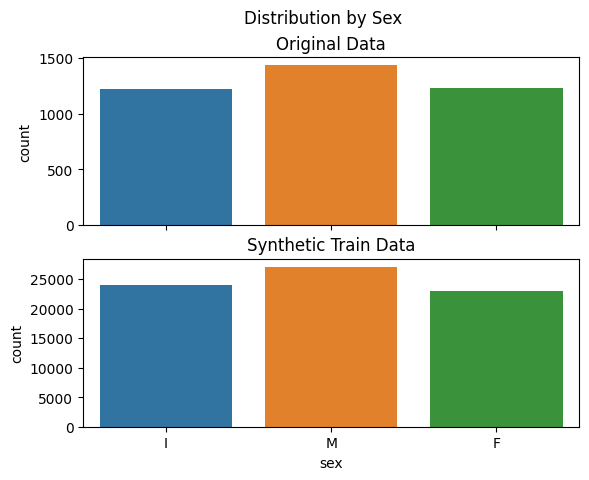

In [89]:
fig, ax = plt.subplots(2, sharex= True)
ax1, ax2 = ax

sns.countplot(data= original_df, x = 'sex', ax=ax1)
ax1.set(title = 'Original Data', xlabel = "")

sns.countplot(data= train_df, x = 'sex', ax=ax2)
ax2.set(title="Synthetic Train Data")

plt.suptitle("Distribution by Sex")

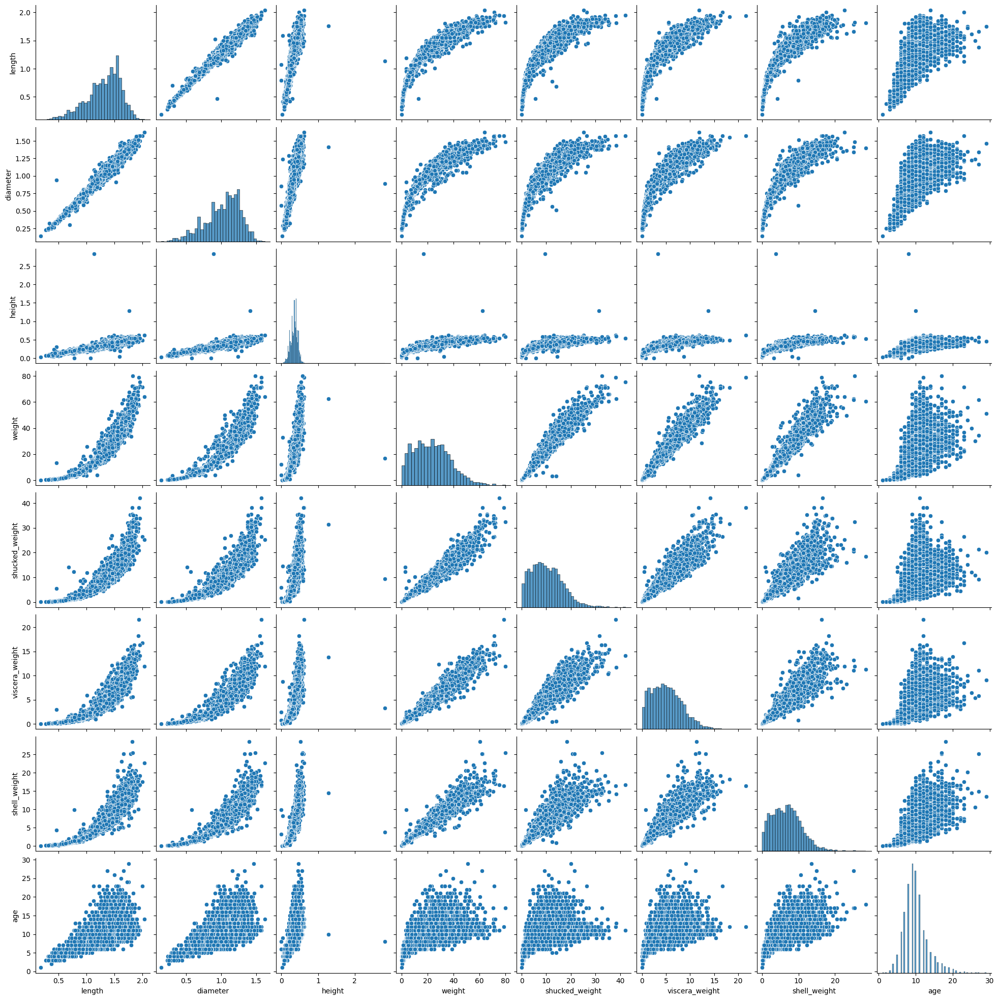

In [102]:
sns.pairplot(data=original_df)

## Skewness Analysis

### OriginalDF - Skewness

In [130]:
original_df_skew = (
    original_df
    .select_dtypes('number')
    .skew()
    .reset_index()
    .rename({"index":"column", 0:'skew'}, axis=1)
)

original_df_skew[(original_df_skew['skew'] > 0.7) | (original_df_skew['skew'] < -0.7)]

,column,skew
2,height,3.314345
4,shucked_weight,0.703114
7,age,1.104710


In [173]:
original_df_skew

,column,skew
0,length,-0.651111
1,diameter,-0.617403
2,height,3.314345
3,weight,0.518903
4,shucked_weight,0.703114
5,viscera_weight,0.578290
6,shell_weight,0.607716
7,age,1.104710


#### Skewness - Height

Skewness: 3.3143452347048594
Upper: 0.6643025866396496, Lower: 0.03444516573640999


(array([9.380e+02, 2.934e+03, 1.900e+01, 0.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([-0.30046962,  0.50811974,  1.3167091 ,  2.12529847,  2.93388783,
         3.74247719,  4.55106656,  5.35965592,  6.16824528,  6.97683464,
         7.78542401]),
 <BarContainer object of 10 artists>)

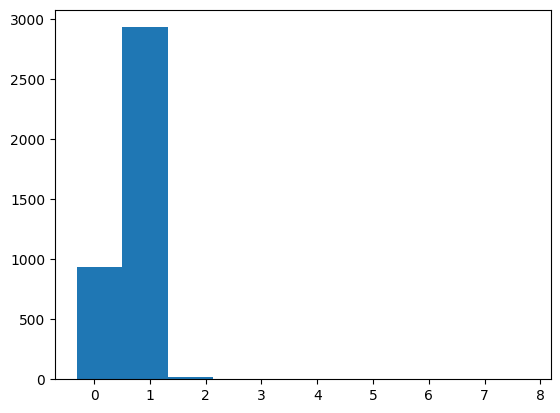

In [146]:
std = original_df['height'].std()
mean = original_df['height'].mean()
height_z_score = (original_df['height'] - std) / mean

print(f"Skewness: {height_z_score.skew()}")

height_z_score_up_limit = mean + (3 * std)
height_z_score_low_limit = mean - (3 * std)

print(f"Upper: {height_z_score_up_limit}, Lower: {height_z_score_low_limit}")

plt.hist(height_z_score)

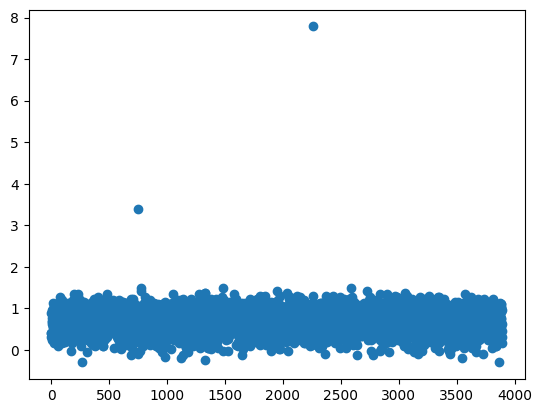

In [168]:
plt.scatter(x = np.arange(len(height_z_score)), y = height_z_score)

In [163]:
height_z_score[height_z_score >= 2.2].index

Index([748, 2256], dtype='int64')

In [164]:
original_df_dropped = original_df.drop([748, 2256])

In [169]:
original_df_dropped['height'].skew()

-0.2870964830172351

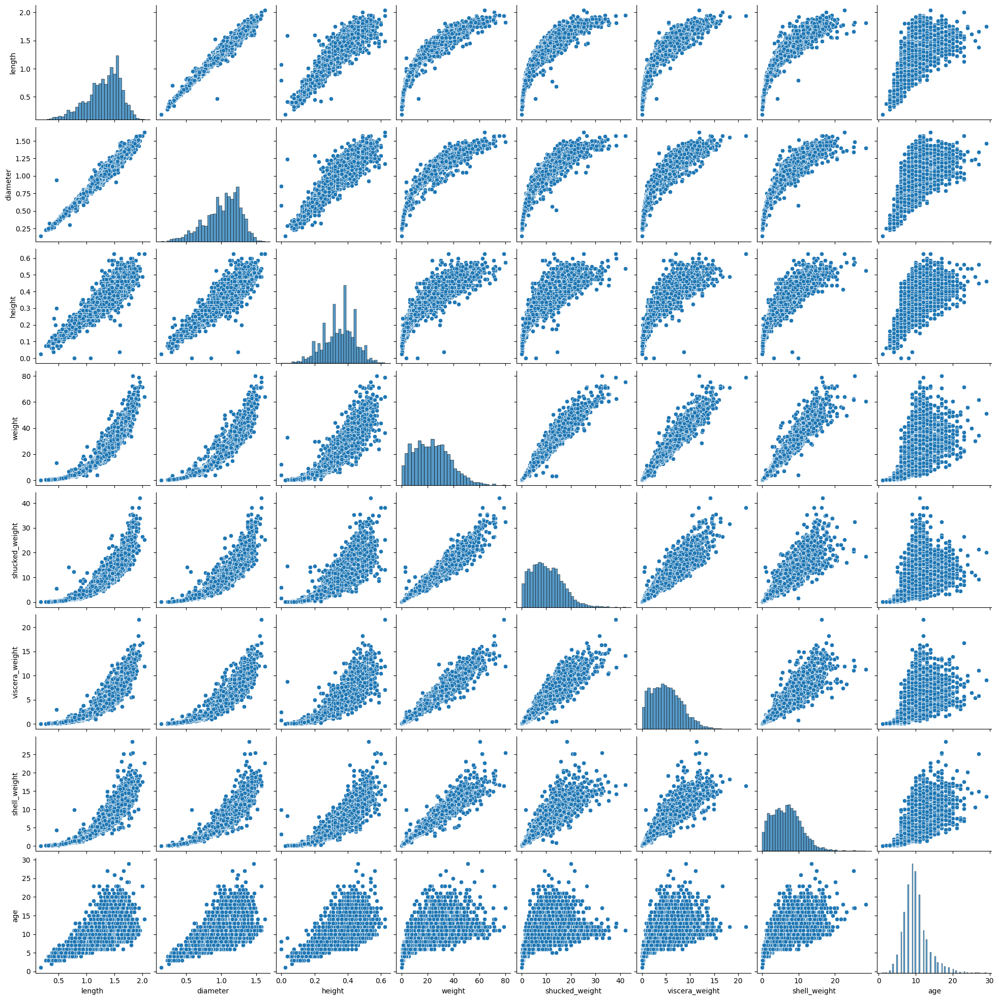

In [165]:
sns.pairplot(original_df_dropped)

#### Skewness - shucked_weight

In [354]:
std = original_df_dropped['shucked_weight'].std()
mean = original_df_dropped['shucked_weight'].mean()

shucked_weight_z_score = (original_df_dropped['shucked_weight'] - std) / mean


shucked_weight_z_score_up_limit = mean + (3 * std)
shucked_weight_z_score_low_limit = mean - (3 * std)

print(f"Skew: {shucked_weight_z_score.skew()}")
print(f"Low Limit: {shucked_weight_z_score_low_limit}")
print(f"Up Limit: {shucked_weight_z_score_up_limit}")


Skew: 0.6986113065159981
Low Limit: -8.600913258993995
Up Limit: 29.005114338536526


In [355]:
filter_condition = (
    (original_df_dropped['shucked_weight'] > shucked_weight_z_score_low_limit) & 
    (original_df_dropped['shucked_weight'] < shucked_weight_z_score_up_limit)
)

indicies_to_drop = original_df_dropped['shucked_weight'][~filter_condition].index

original_df_dropped1 = original_df_dropped.drop(indicies_to_drop)

print(f"Skew after removing outliers: {original_df_dropped1['shucked_weight'].skew()}")

Skew after removing outliers: 0.44861959575772553


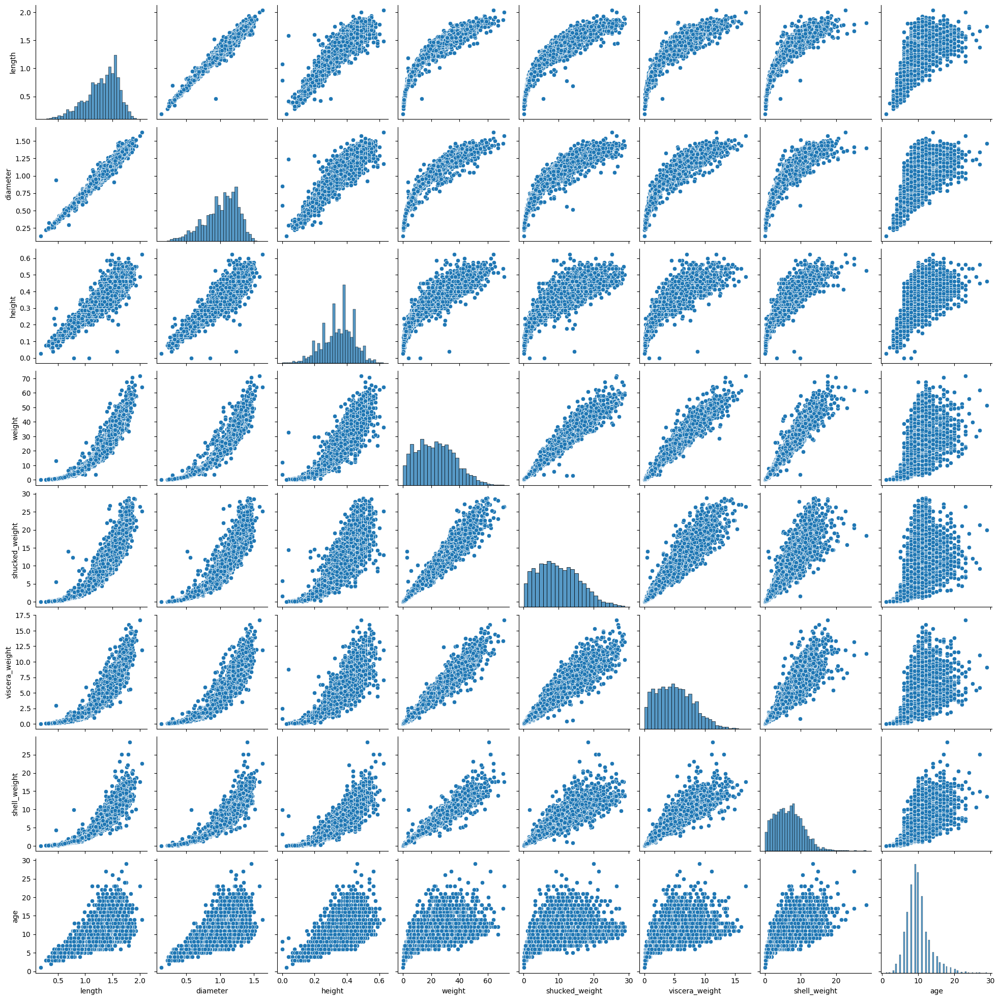

In [211]:
sns.pairplot(original_df_dropped1)

In [212]:
original_df_dropped1.select_dtypes('number').skew()

length           -0.679838
diameter         -0.643756
height           -0.308065
weight            0.383034
shucked_weight    0.448620
viscera_weight    0.475601
shell_weight      0.566291
age               1.111958
dtype: float64

#### Skewness - shell_weight

<Axes: ylabel='Frequency'>

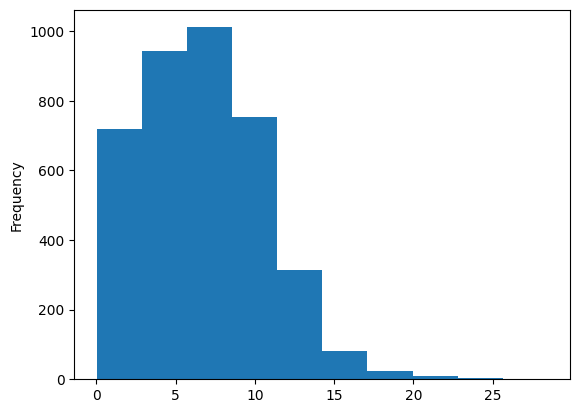

In [219]:
original_df_dropped1['shell_weight'].plot.hist()

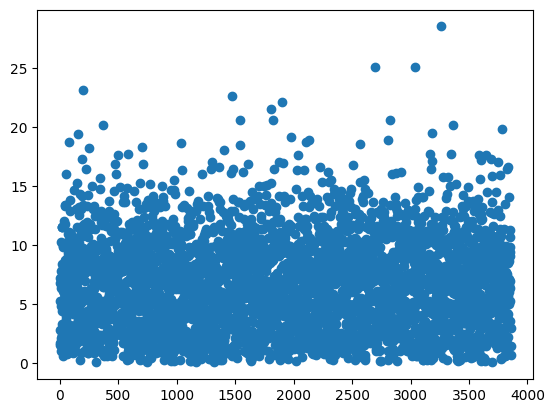

In [221]:
plt.scatter(np.arange(len(original_df_dropped1)), original_df_dropped1['shell_weight'])

In [222]:
std = original_df_dropped1['shell_weight'].std()
mean = original_df_dropped1['shell_weight'].mean()

shell_weight_z_score = (original_df_dropped1['shell_weight'] - std) / mean


shell_weight_z_score_up_limit = mean + (3 * std)
shell_weight_z_score_low_limit = mean - (3 * std)

print(f"Skew: {shell_weight_z_score.skew()}")
print(f"Low Limit: {shell_weight_z_score_low_limit}")
print(f"Up Limit: {shell_weight_z_score_up_limit}")


Skew: 0.5662911851947928
Low Limit: -4.859018928374835
Up Limit: 18.29429437009549


In [225]:
filter_condition = (
    (original_df_dropped1['shell_weight'] > shell_weight_z_score_low_limit) & 
    (original_df_dropped1['shell_weight'] < shell_weight_z_score_up_limit)
)

indicies_to_drop = original_df_dropped1['shell_weight'][~filter_condition].index

original_df_dropped2 = original_df_dropped1.drop(indicies_to_drop)

print(f"Skew after removing outliers: {original_df_dropped2['shell_weight'].skew()}")

Skew after removing outliers: 0.34249941510495063


In [228]:
original_df_dropped1.shape[0] - original_df_dropped2.shape[0]

24

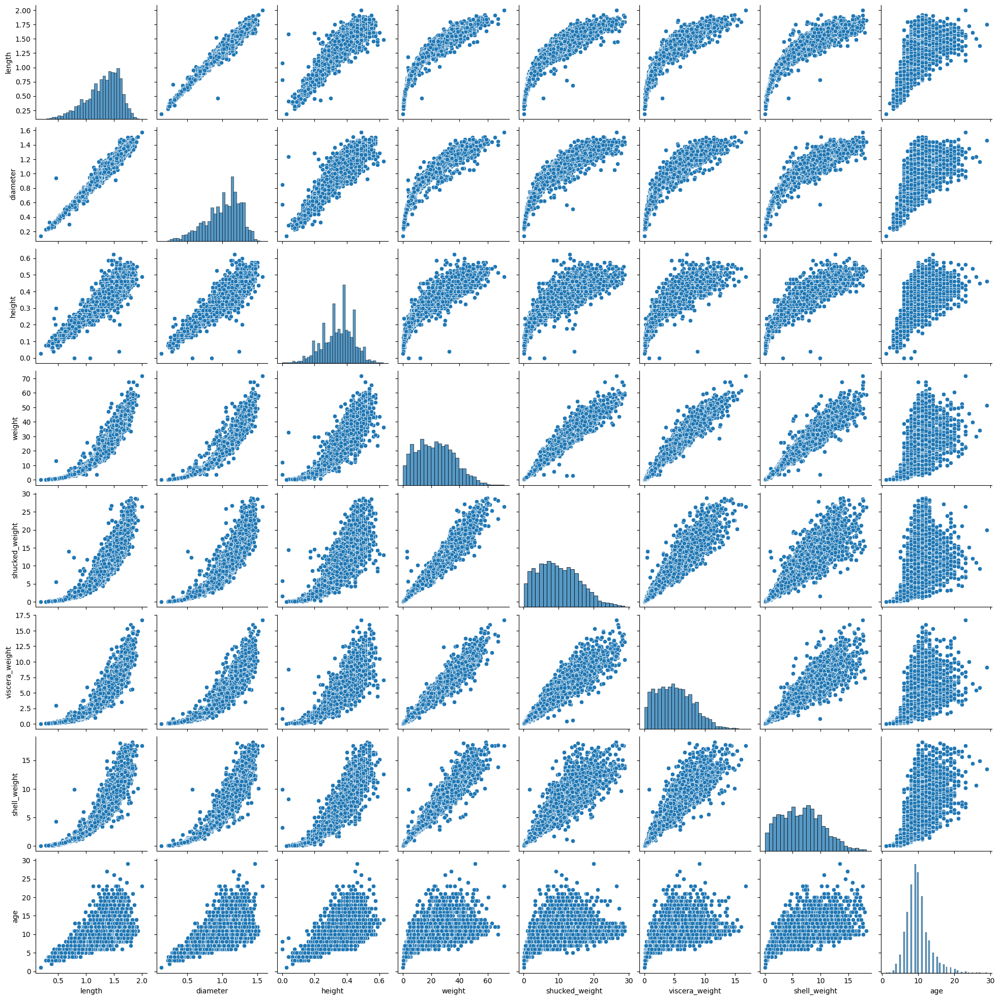

In [229]:
sns.pairplot(original_df_dropped2)

In [230]:
original_df_dropped2.select_dtypes('number').skew()

length           -0.692375
diameter         -0.655809
height           -0.334046
weight            0.340367
shucked_weight    0.451520
viscera_weight    0.468480
shell_weight      0.342499
age               1.089053
dtype: float64

#### Skewness - length

<Axes: ylabel='Frequency'>

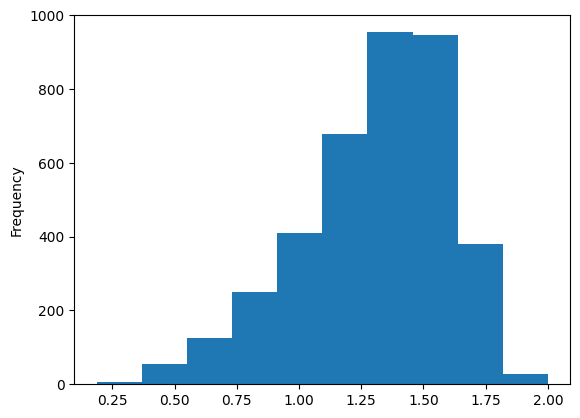

In [231]:
original_df_dropped2['length'].plot.hist()

In [232]:
std = original_df_dropped2['length'].std()
mean = original_df_dropped2['length'].mean()

length_z_score = (original_df_dropped2['length'] - std) / mean


length_z_score_up_limit = mean + (3 * std)
length_z_score_low_limit = mean - (3 * std)

print(f"Skew: {length_z_score.skew()}")
print(f"Low Limit: {length_z_score_low_limit}")
print(f"Up Limit: {length_z_score_up_limit}")


Skew: -0.6923746756412216
Low Limit: 0.4152013309544308
Up Limit: 2.1927712896453087


In [233]:
filter_condition = (
    (original_df_dropped2['length'] > length_z_score_low_limit) & 
    (original_df_dropped2['length'] < length_z_score_up_limit)
)

indicies_to_drop = original_df_dropped2['length'][~filter_condition].index

original_df_dropped3 = original_df_dropped2.drop(indicies_to_drop)

print(f"Skew after removing outliers: {original_df_dropped3['length'].skew()}")

Skew after removing outliers: -0.6257443020165812


In [234]:
original_df_dropped2.shape[0] - original_df_dropped3.shape[0]

18

<Axes: ylabel='Frequency'>

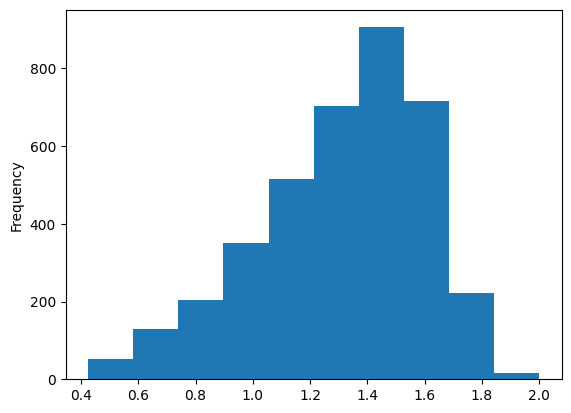

In [235]:
original_df_dropped3['length'].plot.hist()

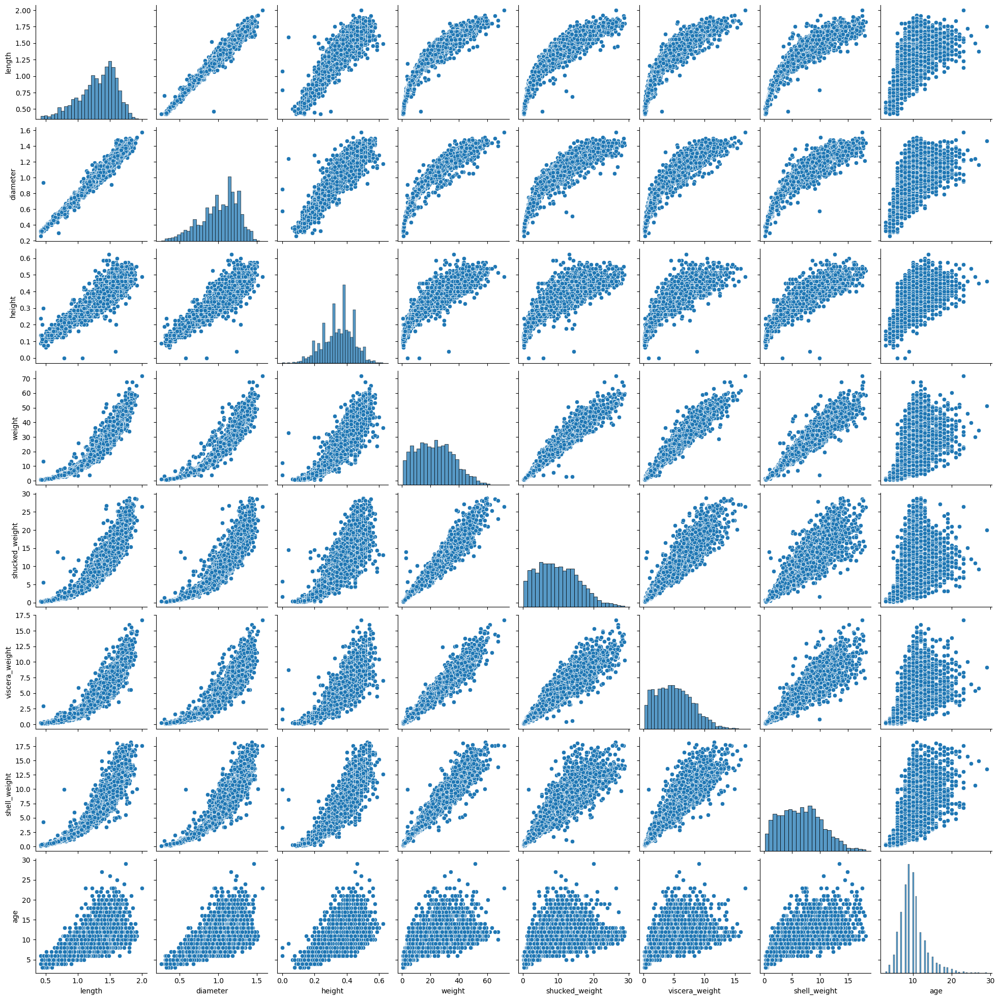

In [237]:
sns.pairplot(original_df_dropped3)

In [238]:
original_df_dropped3.select_dtypes('number').skew()

length           -0.625744
diameter         -0.600448
height           -0.277545
weight            0.346449
shucked_weight    0.457531
viscera_weight    0.474522
shell_weight      0.349950
age               1.132321
dtype: float64

In [239]:
original_df_dropped3.to_csv("../data/transformed/original_outliers_removed.csv", header=True, index=False)

In [240]:
print(f"Number of Records Dropped: {original_df.shape[0] - original_df_dropped3.shape[0]}")

Number of Records Dropped: 76


In [241]:
original_df_dropped3.describe()

,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age
count,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000
mean,1.308426,1.018395,0.347285,23.106306,9.998075,5.053044,6.660651,9.934504
std,0.289774,0.239956,0.092724,13.089094,5.876250,2.969151,3.684910,3.161931
min,0.425000,0.262500,0.000000,0.666213,0.226796,0.099223,0.141747,3.000000
25%,1.125000,0.875000,0.287500,12.672227,5.329706,2.664853,3.713785,8.000000
50%,1.362500,1.062500,0.350000,22.594552,9.468733,4.819415,6.633783,9.000000
75%,1.537500,1.200000,0.412500,32.332605,14.047177,7.073200,9.199413,11.000000
max,2.000000,1.575000,0.625000,71.610837,28.831442,16.726205,18.228728,29.000000


In [242]:
original_df.describe()

,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age
count,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000
mean,1.311306,1.020893,0.349374,23.567275,10.207342,5.136546,6.795844,9.954791
std,0.300431,0.248233,0.104976,13.891201,6.275275,3.104133,3.943392,3.220967
min,0.187500,0.137500,0.000000,0.056699,0.028349,0.014175,0.042524,1.000000
25%,1.125000,0.875000,0.287500,12.672227,5.343881,2.664853,3.713785,8.000000
50%,1.362500,1.062500,0.362500,22.792998,9.539607,4.861939,6.662133,10.000000
75%,1.537500,1.200000,0.412500,32.786197,14.273973,7.200773,9.355335,11.000000
max,2.037500,1.625000,2.825000,80.101512,42.184056,21.545620,28.491248,29.000000


In [336]:
original_df_log = original_df_dropped3.copy()

for column in original_df_log.columns:
    if column != 'sex' and column != 'age':
        original_df_log[column] = original_df_log[column].apply(np.log1p)

original_df_log.select_dtypes('number').skew()

length           -0.945813
diameter         -0.888631
height           -0.456553
weight           -0.994567
shucked_weight   -0.772652
viscera_weight   -0.575849
shell_weight     -0.744710
age               1.132321
dtype: float64

### TrainDF - Skewness

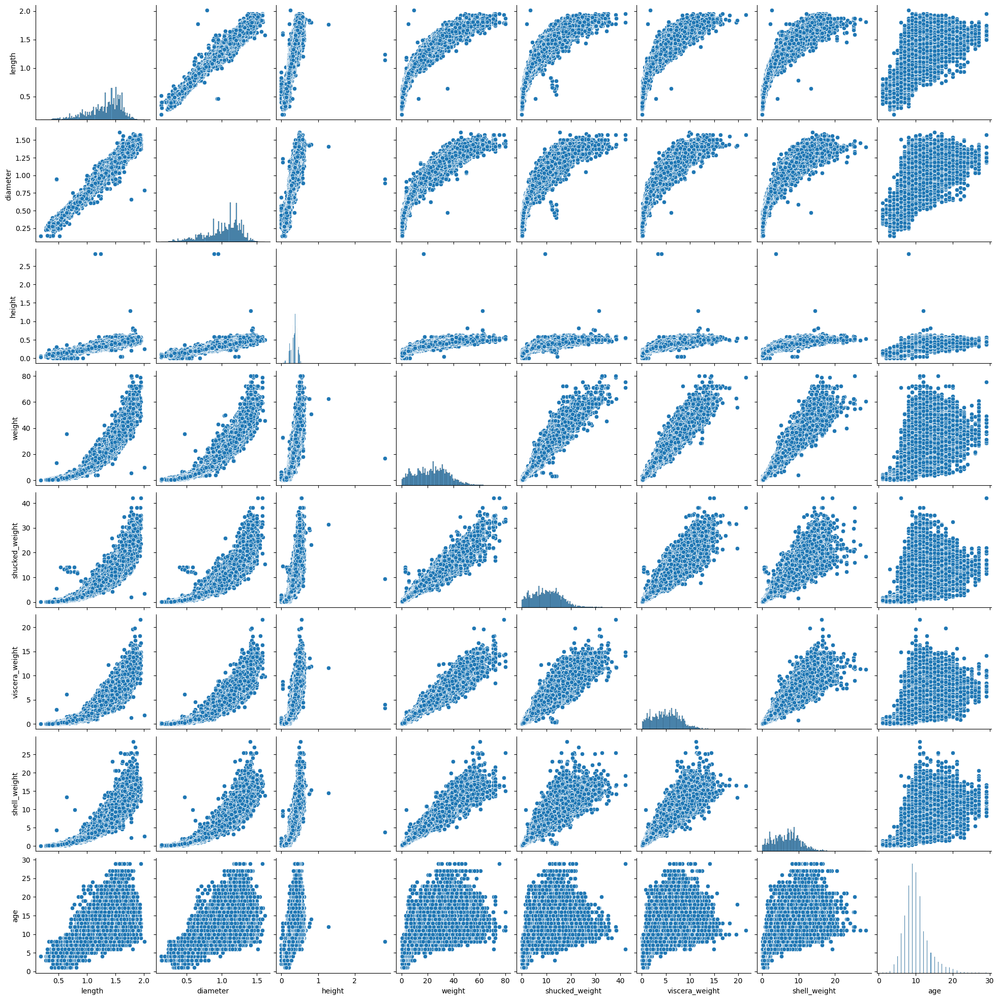

In [243]:
sns.pairplot(train_df)

In [245]:
train_df.select_dtypes('number').skew()

length           -0.844377
diameter         -0.812866
height            0.086578
weight            0.231465
shucked_weight    0.349472
viscera_weight    0.286383
shell_weight      0.277459
age               1.092919
dtype: float64

In [246]:
train_df.describe()

,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age
count,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000
mean,1.317460,1.024496,0.348089,23.385217,10.104270,5.058386,6.723870,9.967806
std,0.287757,0.237396,0.092034,12.648153,5.618025,2.792729,3.584372,3.175189
min,0.187500,0.137500,0.000000,0.056699,0.028349,0.042524,0.042524,1.000000
25%,1.150000,0.887500,0.300000,13.437663,5.712424,2.863300,3.968930,8.000000
50%,1.375000,1.075000,0.362500,23.799405,9.908150,4.989512,6.931453,10.000000
75%,1.537500,1.200000,0.412500,32.162508,14.033003,6.988152,9.071840,11.000000
max,2.012815,1.612500,2.825000,80.101512,42.184056,21.545620,28.491248,29.000000


<Axes: >

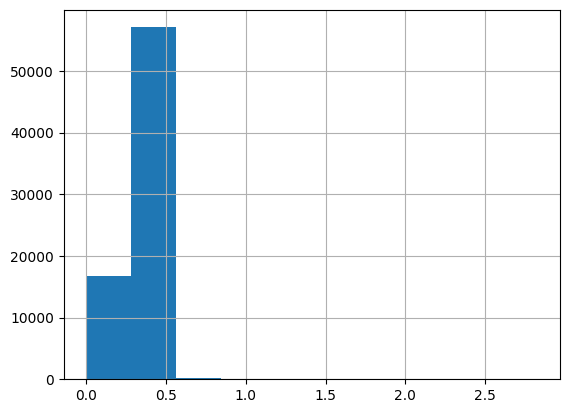

In [248]:
train_df['height'].hist()

In [270]:
from typing import Tuple

def zscore(df: pd.DataFrame, column: str, std_c: int = 3) -> Tuple:
    std = df[column].std()
    mean = df[column].mean()
    
    low = mean - (std_c * std)
    high = mean + (std_c * std)

    return low, high


def drop_outliers(df: pd.DataFrame, column, low, high):
    df = df[(df[column] > low) & (df[column] < high)]
    return df

#### Skewness - height

Number of Records Dropped: 160


<Axes: >

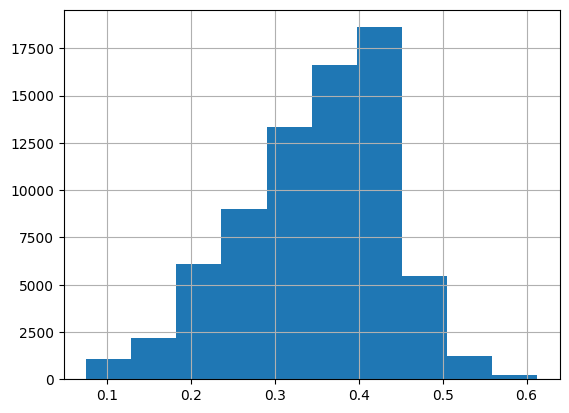

In [269]:
height_low, height_high = zscore(train_df, 'height')
train_df_dropped = drop_outliers(train_df, 'height', height_low, height_high)

print(f"Number of Records Dropped: {train_df.shape[0] - train_df_dropped.shape[0]}")

train_df_dropped['height'].hist()

#### Skewness - length

<Axes: >

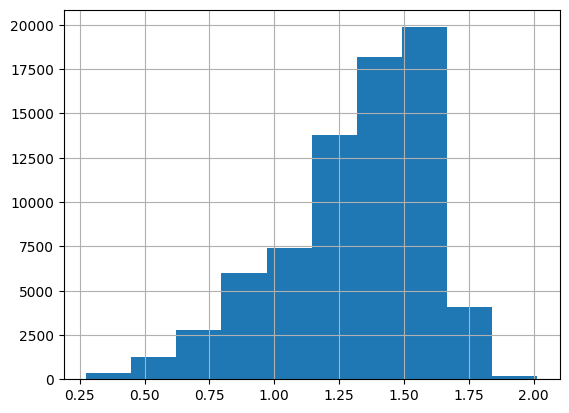

In [271]:
train_df_dropped['length'].hist()

0.46210291223975375 2.1757052934821877
Number of Records Dropped: 408


<Axes: >

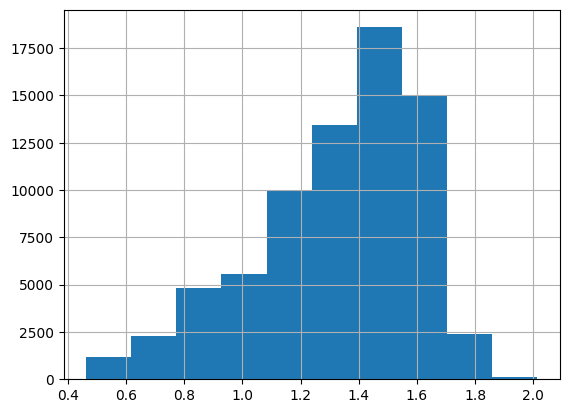

In [279]:
length_low, length_high = zscore(train_df_dropped, 'length')
print(length_low, length_high)
train_df_dropped1 = drop_outliers(train_df_dropped, 'length', length_low, length_high)

print(f"Number of Records Dropped: {train_df_dropped.shape[0] - train_df_dropped1.shape[0]}")

train_df_dropped1['length'].hist()

#### Skewness - diameter

<Axes: >

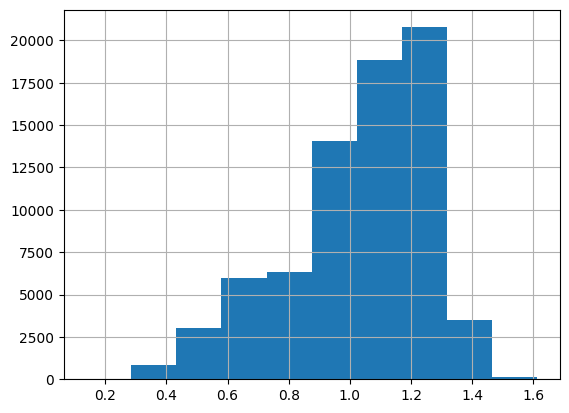

In [280]:
train_df_dropped1['diameter'].hist()

0.3393002969966117 1.7200231211409165
Number of Records Dropped: 180


<Axes: >

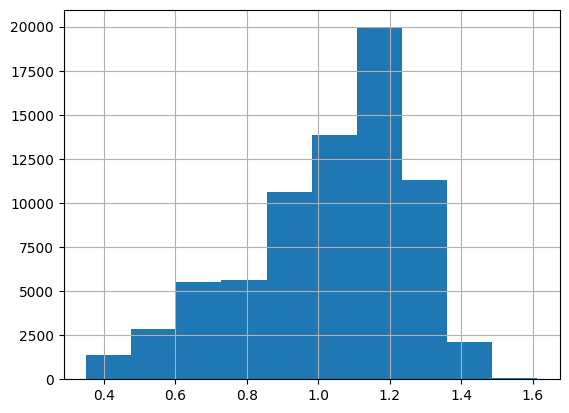

In [283]:
diameter_low, diameter_high = zscore(train_df_dropped1, 'diameter')
print(diameter_low, diameter_high)

train_df_dropped2 = drop_outliers(train_df_dropped1, 'diameter', diameter_low, diameter_high)

print(f"Number of Records Dropped: {train_df_dropped1.shape[0] - train_df_dropped2.shape[0]}")

train_df_dropped2['diameter'].hist()

In [310]:
train_df_dropped2.select_dtypes('number').skew()

length           -0.742446
diameter         -0.719516
height           -0.374090
weight            0.243410
shucked_weight    0.362904
viscera_weight    0.299013
shell_weight      0.292831
age               1.152217
dtype: float64

#### Skewness - weight

<Axes: >

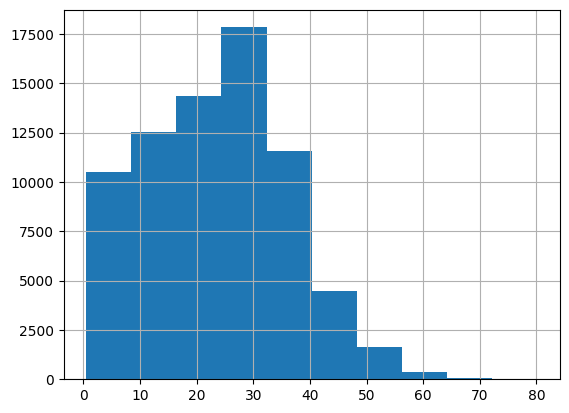

In [342]:
train_df_dropped2['weight'].hist()

-13.900217186549806 61.09879240680894
Number of Records Dropped: 190


<Axes: >

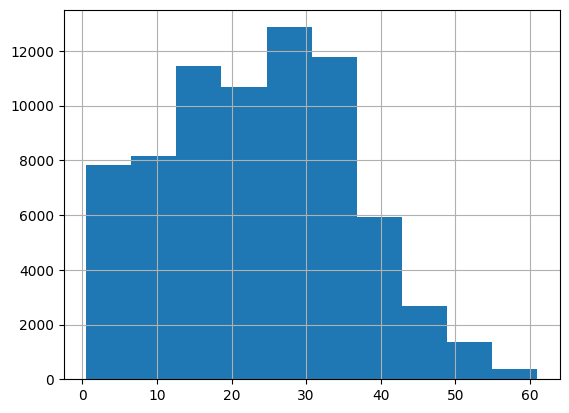

In [345]:
weight_low, weight_high = zscore(train_df_dropped2, 'weight')
print(weight_low, weight_high)

train_df_dropped3 = drop_outliers(train_df_dropped2, 'weight', weight_low, weight_high)

print(f"Number of Records Dropped: {train_df_dropped2.shape[0] - train_df_dropped3.shape[0]}")

train_df_dropped3['weight'].hist()

#### Skewness - shucked_weight

<Axes: >

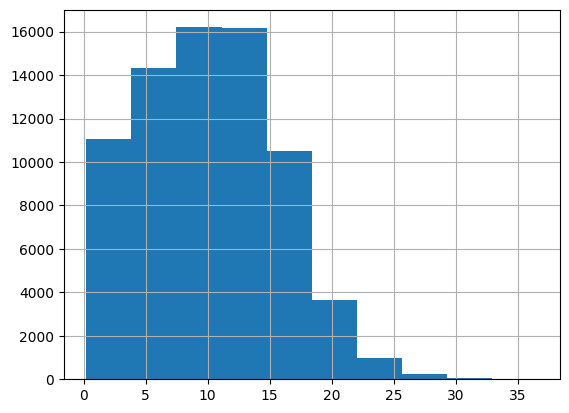

In [346]:
train_df_dropped3['shucked_weight'].hist()

-6.2765751036478115 26.57313285848758
Number of Records Dropped: 177


<Axes: >

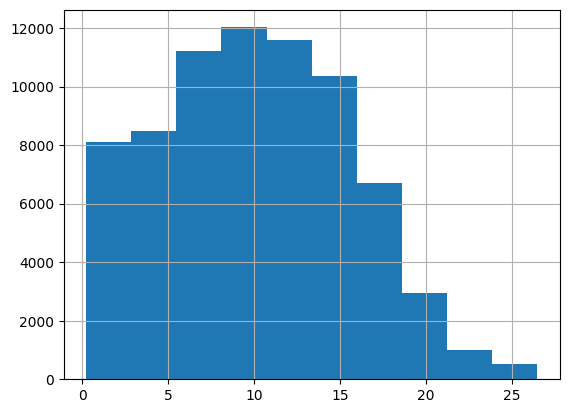

In [351]:
shucked_weight_low, shucked_weight_high = zscore(train_df_dropped3, 'shucked_weight')
print(shucked_weight_low, shucked_weight_high)

train_df_dropped4 = drop_outliers(train_df_dropped3, 'shucked_weight', shucked_weight_low, shucked_weight_high)

print(f"Number of Records Dropped: {train_df_dropped3.shape[0] - train_df_dropped4.shape[0]}")

train_df_dropped4['shucked_weight'].hist()

#### Skewness - shell_weight

<Axes: >

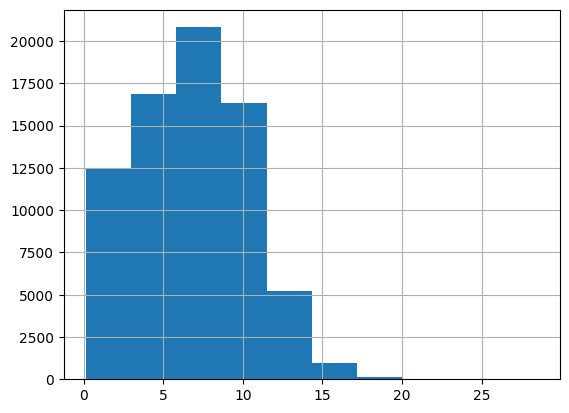

In [353]:
train_df_dropped4['shell_weight'].hist()

-3.7279137836060636 17.210513281201216
Number of Records Dropped: 198


<Axes: >

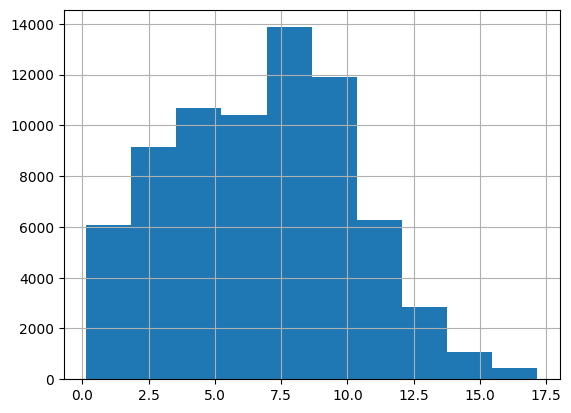

In [365]:
shell_weight_low, shell_weight_high = zscore(train_df_dropped4, 'shell_weight')
print(shell_weight_low, shell_weight_high)

train_df_dropped5 = drop_outliers(train_df_dropped4, 'shell_weight', shell_weight_low, shell_weight_high)

print(f"Number of Records Dropped: {train_df_dropped4.shape[0] - train_df_dropped5.shape[0]}")

train_df_dropped5['shell_weight'].hist()

#### Skewness - viscera_weight

<Axes: >

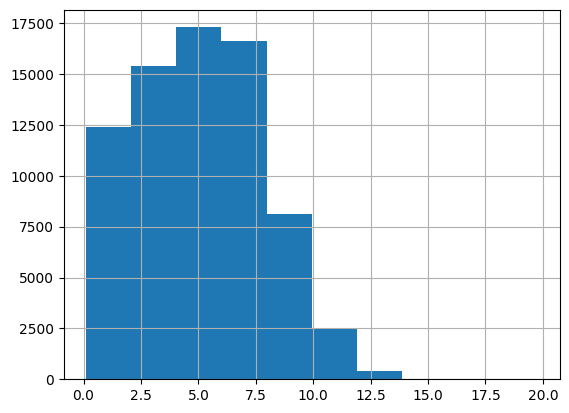

In [366]:
train_df_dropped5['viscera_weight'].hist()

-3.0539046862096324 13.158294740927934
Number of Records Dropped: 109


<Axes: >

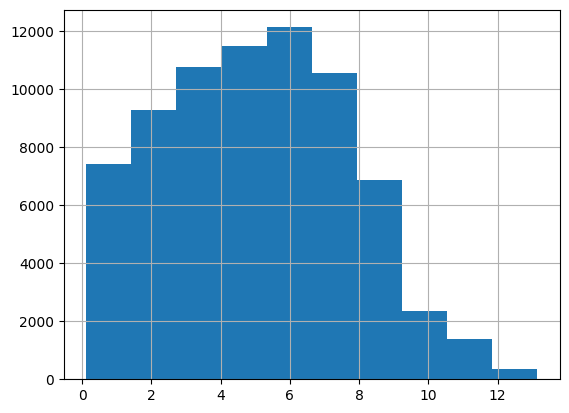

In [371]:
viscera_weight_low, viscera_weight_high = zscore(train_df_dropped5, 'viscera_weight')
print(viscera_weight_low, viscera_weight_high)

train_df_dropped6 = drop_outliers(train_df_dropped5, 'viscera_weight', viscera_weight_low, viscera_weight_high)

print(f"Number of Records Dropped: {train_df_dropped5.shape[0] - train_df_dropped6.shape[0]}")

train_df_dropped6['viscera_weight'].hist()

In [375]:
print(f"Number of records dropped: {train_df.shape[0] - train_df_dropped6.shape[0]}")

Number of records dropped: 1422


In [374]:
train_df_dropped6.select_dtypes('number').skew()

length           -0.767382
diameter         -0.742829
height           -0.401795
weight            0.118403
shucked_weight    0.213373
viscera_weight    0.191138
shell_weight      0.142729
age               1.152676
dtype: float64

In [372]:
train_df_dropped6.describe()

,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age
count,72629.000000,72629.000000,72629.000000,72629.000000,72629.000000,72629.000000,72629.000000,72629.000000
mean,1.321819,1.027968,0.348993,23.285068,10.061807,5.039049,6.695878,9.994589
std,0.273206,0.225857,0.086862,12.103504,5.373712,2.682458,3.421995,3.122172
min,0.462500,0.350000,0.075000,0.496116,0.212621,0.113398,0.141747,1.000000
25%,1.162500,0.887500,0.300000,13.551061,5.783298,2.905824,3.968930,8.000000
50%,1.375000,1.075000,0.362500,23.799405,9.908150,4.989512,6.945627,10.000000
75%,1.525000,1.200000,0.412500,32.119983,13.990478,6.973977,9.071840,11.000000
max,2.012815,1.612500,0.612500,60.696280,26.450084,13.139993,17.151447,29.000000


In [376]:
train_df.describe()

,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age
count,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000
mean,1.317460,1.024496,0.348089,23.385217,10.104270,5.058386,6.723870,9.967806
std,0.287757,0.237396,0.092034,12.648153,5.618025,2.792729,3.584372,3.175189
min,0.187500,0.137500,0.000000,0.056699,0.028349,0.042524,0.042524,1.000000
25%,1.150000,0.887500,0.300000,13.437663,5.712424,2.863300,3.968930,8.000000
50%,1.375000,1.075000,0.362500,23.799405,9.908150,4.989512,6.931453,10.000000
75%,1.537500,1.200000,0.412500,32.162508,14.033003,6.988152,9.071840,11.000000
max,2.012815,1.612500,2.825000,80.101512,42.184056,21.545620,28.491248,29.000000


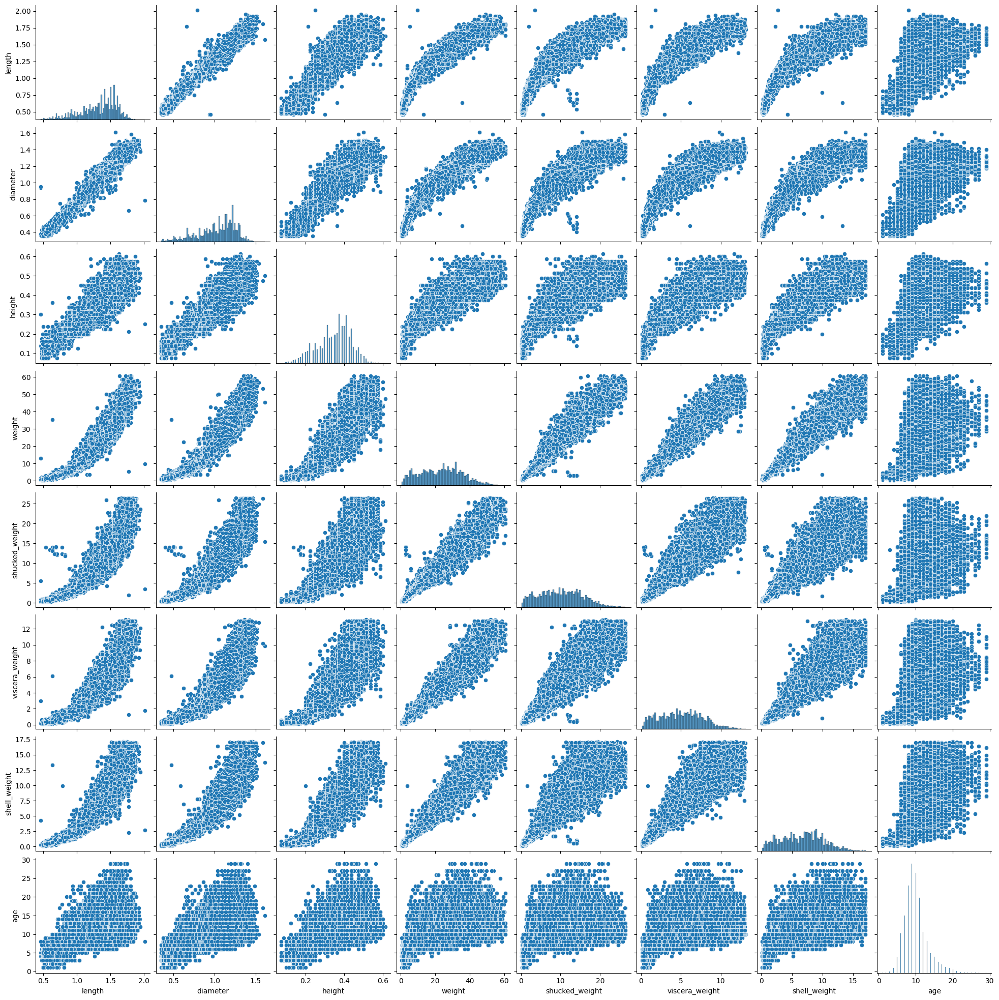

In [384]:
sns.pairplot(train_df_dropped6)

In [395]:
train_df_dropped6.to_csv("../data/transformed/train_outliers_removed.csv", header=True, index=True)

# note: need to consider a model with age > 2 for synthetic data